# Exploratory Data Analysis of Sound Waves

Importing all the required packages

In [2]:
import numpy as np
np.random.seed(1001)

import os
import shutil
import wave
import IPython
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import itertools
import glob
import scipy.io
import plotly.plotly as py
import cufflinks as cf
import plotly.tools as tls
import collections
from tqdm import tqdm_notebook
from sklearn.cross_validation import StratifiedKFold

%matplotlib inline
matplotlib.style.use('ggplot')

Reading the Train data CSV file

In [6]:
train = pd.read_csv("train.csv")

Reading the audio data from the .wav files

In [14]:
audiofiles_duration = []
path = "audio_train/audio_train/"
files = os.listdir(path)

for filename in glob.glob(os.path.join(path, '*.wav')):
    wav = wave.open(filename)
    duration = wav.getnframes()/wav.getframerate()
    audiofiles_duration.append(duration)

In [15]:
print(np.mean(audiofiles_duration))

6.787997466483691


Now, using Counter package, we find out the most common duration of the wave files and the number of occurences of that duration. Also, creating the dictionary based on the audio durations.

In [16]:
from collections import Counter
most_common,num_most_common = Counter(audiofiles_duration).most_common(1)[0]
print(most_common,',',num_most_common)

2.0 , 108


In [17]:
counter=collections.Counter(audiofiles_duration)
dictx =dict(counter)
print(dictx)

{14.0: 8, 10.32: 3, 0.44: 32, 8.0: 49, 4.52: 9, 13.28: 2, 1.36: 34, 1.04: 25, 7.0: 23, 29.64: 2, 1.68: 42, 20.64: 4, 1.12: 29, 4.06: 15, 5.7: 10, 2.64: 17, 4.34: 15, 15.52: 4, 1.56: 33, 2.5: 28, 2.1: 45, 7.1: 7, 2.62: 15, 4.48: 7, 9.74: 3, 3.18: 11, 5.0: 48, 14.08: 4, 17.5: 7, 0.76: 45, 6.24: 10, 10.1: 2, 6.26: 9, 8.88: 8, 14.56: 3, 17.76: 5, 5.5: 30, 18.12: 3, 5.14: 10, 6.3: 7, 1.66: 20, 0.66: 36, 24.38: 4, 2.06: 51, 4.02: 20, 2.04: 23, 1.88: 28, 4.64: 15, 0.82: 34, 29.7: 1, 2.08: 30, 0.86: 31, 4.94: 8, 8.64: 5, 6.78: 7, 0.98: 38, 3.04: 18, 25.94: 3, 3.8: 12, 3.7: 21, 9.48: 2, 6.14: 8, 1.0: 51, 24.12: 2, 1.94: 15, 0.68: 47, 20.1: 4, 24.2: 3, 0.6: 50, 3.52: 22, 1.76: 22, 12.0: 12, 22.74: 2, 2.34: 23, 18.82: 5, 1.54: 26, 0.48: 31, 0.38: 41, 0.88: 31, 3.14: 49, 1.32: 33, 23.16: 3, 1.42: 38, 11.8: 5, 8.92: 6, 2.02: 17, 8.5: 11, 23.6: 4, 0.54: 35, 7.52: 8, 19.92: 3, 6.2: 12, 2.18: 13, 3.32: 10, 15.48: 1, 1.4: 45, 6.5: 26, 7.06: 8, 6.84: 5, 8.86: 4, 6.0: 44, 19.56: 5, 20.22: 4, 7.12: 5, 1.1

In [18]:
print(len(dictx))

1322


Fetching first N pairs out of the large dictionary to plot them

In [19]:
n=25
firstNpairs = {k: dictx[k] for k in list(dictx.keys())[:n]}
print(firstNpairs)

{14.0: 8, 10.32: 3, 0.44: 32, 8.0: 49, 4.52: 9, 13.28: 2, 1.36: 34, 1.04: 25, 7.0: 23, 29.64: 2, 1.68: 42, 20.64: 4, 1.12: 29, 4.06: 15, 5.7: 10, 2.64: 17, 4.34: 15, 15.52: 4, 1.56: 33, 2.5: 28, 2.1: 45, 7.1: 7, 2.62: 15, 4.48: 7, 9.74: 3}


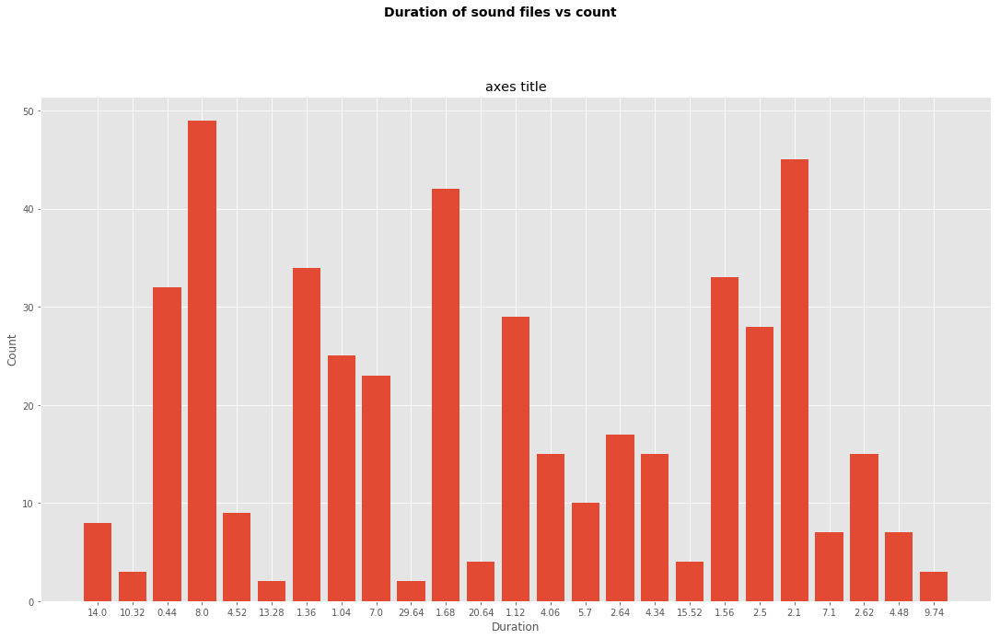

In [20]:
fig = plt.figure()
fig.set_size_inches(18.5, 10.5, forward=True)
ax = fig.add_subplot(111)
fig.subplots_adjust(top=0.85)
ax.set_title('axes title')
ax.set_xlabel('Duration')
ax.set_ylabel('Count')
#plt.bar(range(len(dictx)), dictx.values(), align='center')
plt.bar(range(len(firstNpairs)), firstNpairs.values(), align='center')
#plt.xticks(range(len(dictx)), list(dictx.keys()))
plt.xticks(range(len(firstNpairs)), list(firstNpairs.keys()))
fig.suptitle('Duration of sound files vs count', fontsize=14, fontweight='bold')

plt.show()

In the above graph, we can see that, there are more than 1300 dictionary entries which would be very difficult to plot in a single graph and differentiate between them. So, let's consider some other factor to classify the audio files to narrow down the groups.



Let's consider the labels as the classification factor instead of the duration.

Updating the dataframe with the duration of each audio file along with the associated/respective labels.

In [21]:
train['duration'] = train['fname'].apply(lambda f: wave.open(path + f).getnframes()/wave.open(path + f).getframerate())

In [22]:
train.head(10)

,fname,label,manually_verified,duration
0,00044347.wav,Hi-hat,0,14.00
1,001ca53d.wav,Saxophone,1,10.32
2,002d256b.wav,Trumpet,0,0.44
3,0033e230.wav,Glockenspiel,1,8.00
4,00353774.wav,Cello,1,4.52
5,003b91e8.wav,Cello,0,13.28
6,003da8e5.wav,Knock,1,1.36
7,0048fd00.wav,Gunshot_or_gunfire,1,1.04
8,004ad66f.wav,Clarinet,0,7.00
9,0063ab88.wav,Computer_keyboard,0,29.64


In [23]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected = True)
import cufflinks as cf
cf.go_offline()

import plotly.graph_objs as go

train['count'] = train.groupby('label')['label'].transform('count')     #it is the label count i.e number of files per label
data = [go.Bar(
            x=train['label'],
            y=train['count']
    )]

iplot(data, filename='basic-bar')

In [24]:
train.head(10)

,fname,label,manually_verified,duration,count
0,00044347.wav,Hi-hat,0,14.00,300
1,001ca53d.wav,Saxophone,1,10.32,300
2,002d256b.wav,Trumpet,0,0.44,300
3,0033e230.wav,Glockenspiel,1,8.00,94
4,00353774.wav,Cello,1,4.52,300
5,003b91e8.wav,Cello,0,13.28,300
6,003da8e5.wav,Knock,1,1.36,279
7,0048fd00.wav,Gunshot_or_gunfire,1,1.04,147
8,004ad66f.wav,Clarinet,0,7.00,300
9,0063ab88.wav,Computer_keyboard,0,29.64,119





We now also update the 'count' column which indicates the number of audio files with the same label name for understanding the further statistics. We plot a bar graph for the same dataset.







We further classify the counts on the basis of manually_verified parameter and plot them again using a grouped bar chart.





In [25]:
train['count_verified'] = train.groupby(['label','manually_verified'])['label'].transform('count')     #it is the label count i.e number of files per label
train.head(10)

,fname,label,manually_verified,duration,count,count_verified
0,00044347.wav,Hi-hat,0,14.00,300,211
1,001ca53d.wav,Saxophone,1,10.32,300,256
2,002d256b.wav,Trumpet,0,0.44,300,214
3,0033e230.wav,Glockenspiel,1,8.00,94,70
4,00353774.wav,Cello,1,4.52,300,125
5,003b91e8.wav,Cello,0,13.28,300,175
6,003da8e5.wav,Knock,1,1.36,279,90
7,0048fd00.wav,Gunshot_or_gunfire,1,1.04,147,145
8,004ad66f.wav,Clarinet,0,7.00,300,170
9,0063ab88.wav,Computer_keyboard,0,29.64,119,59


In [27]:
trace1 = go.Bar(
   y=train.drop_duplicates('label')['count_verified'],   #drop duplicates for label as we dont need it here 
   x=train['label'],
   name='Manually Verified',
   hoverinfo= 'none'
)

trace2 = go.Bar(
   y=train.drop_duplicates('label')['count'] - train.drop_duplicates('label')['count_verified'],
   x=train['label'],
   name='Manually Not Verified',
   hoverinfo= 'none'
)
data = [trace1, trace2]
layout = go.Layout(
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='grouped-bar')
#iplot(data, filename='basic-bar')


Now, let's analyze the data further by using a word cloud.

We here use the 'count' parameter as the factor for designing the word cloud. The 'count' factor shows the classification of the data based on the number of files falling under a particular label making it a worthy parameter to utilize.

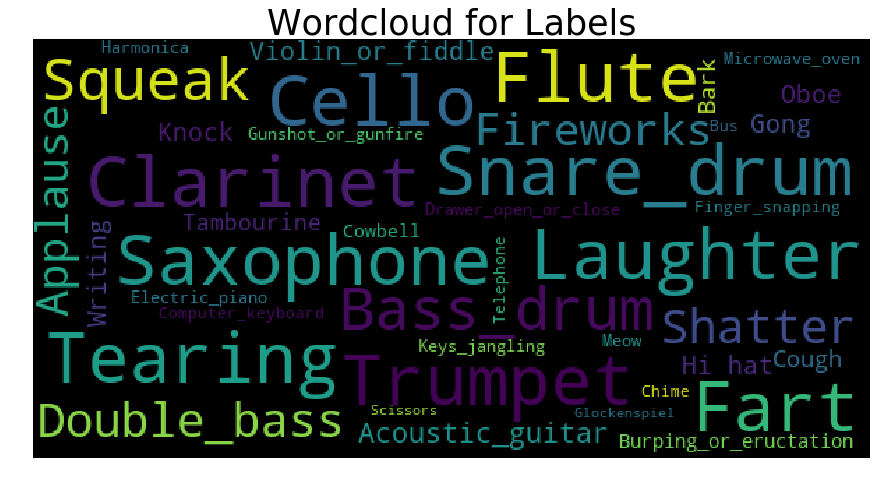

In [28]:
import os
import matplotlib.pyplot as plt
from wordcloud import WordCloud
wordcloud = WordCloud(max_font_size=50, width=600, height=300).generate(' '.join(train.label))
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.title("Wordcloud for Labels", fontsize=35)
plt.axis("off")
plt.show() 

Here we are using Counter dict subclass for counting the labels from Dataframe.Then they are put into list and the list is printed.value_counts will Return value containing counts of unique labels.

In [29]:
c = Counter(train.label)
print(list(c))
print('\nThe Audio samples count is {}.'.format(len(train.label.value_counts())))

['Hi-hat', 'Saxophone', 'Trumpet', 'Glockenspiel', 'Cello', 'Knock', 'Gunshot_or_gunfire', 'Clarinet', 'Computer_keyboard', 'Keys_jangling', 'Snare_drum', 'Writing', 'Laughter', 'Tearing', 'Fart', 'Oboe', 'Flute', 'Cough', 'Telephone', 'Bark', 'Chime', 'Bass_drum', 'Bus', 'Squeak', 'Scissors', 'Harmonica', 'Gong', 'Microwave_oven', 'Burping_or_eructation', 'Double_bass', 'Shatter', 'Fireworks', 'Tambourine', 'Cowbell', 'Electric_piano', 'Meow', 'Drawer_open_or_close', 'Applause', 'Acoustic_guitar', 'Violin_or_fiddle', 'Finger_snapping']

The Audio samples count is 41.


We create the audio object and load the file random file.

In [31]:
import librosa
y, sr = librosa.load('Stereo/Bass-electric.wav')

IPython.display.Audio(data=y, rate=sr)

using the waveplot of librosa.display we are plotting the envelope of waveform of the selected audio file.

Text(0.5,1,'Stereo')

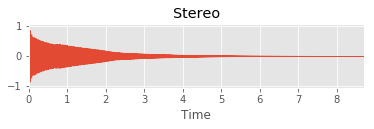

In [32]:
import librosa.display
import IPython.display
plt.figure()
plt.subplot(3, 1, 1)
librosa.display.waveplot(y, sr=sr)
plt.title('Stereo')

In [33]:
import librosa
y, sr = librosa.load(path+'001ca53d.wav')
IPython.display.Audio(data=y, rate=sr)

Seperating the harmonic and percussive components of the monophonic file to analyse the distinct components

In [34]:
# Separating harmonic and percussive components
y_h, y_p = librosa.effects.hpss(y)
# Play the harmonic component
IPython.display.Audio(data=y_h, rate=sr)

In [35]:
# Play the percussive component
IPython.display.Audio(data=y_p, rate=sr)

Plot the amplitude envelope of a waveform.

Text(0.5,1,'Monophonic')

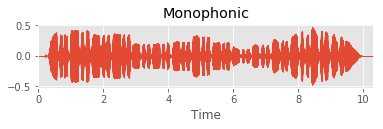

In [36]:
#If y is monophonic, a filled curve is drawn between [-abs(y), abs(y)].
import librosa.display
import IPython.display
plt.figure()
plt.subplot(3, 1, 1)
librosa.display.waveplot(y, sr=sr)
plt.title('Monophonic')

In [37]:
import librosa
y, sr = librosa.load(path+'0079d310.wav')
IPython.display.Audio(data=y, rate=sr)

Text(0.5,1,'Monophonic')

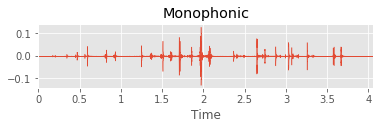

In [38]:
#Plot the amplitude envelope of a waveform.
#If y is monophonic, a filled curve is drawn between [-abs(y), abs(y)].
import librosa.display
import IPython.display
plt.figure()
plt.subplot(3, 1, 1)
librosa.display.waveplot(y, sr=sr)
plt.title('Monophonic')

Now, let's analyze the audio file in the terms of Amplitude and Frequency using the FFT methodology.

In [39]:
rate,audData=scipy.io.wavfile.read(path+'001ca53d.wav')
print(audData)

[-33 -32 -34 ...  -1  -1  -1]


In [40]:
channel1=audData[:]

Plotting the Amplitude graph of the audio file against the time

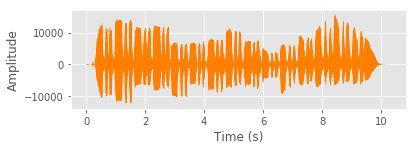

In [41]:
#create a time variable in seconds
time = np.arange(0, float(audData.shape[0]), 1) / rate

#plot amplitude (or loudness) over time
plt.figure(1)
plt.subplot(211)
plt.plot(time, channel1, linewidth=0.1, alpha=1, color='#ff7f00')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

Plotting the Amplitude using the FFT method against the frequency of the audio file

C:\Users\Madhuja Gosavi\Anaconda3\lib\site-packages\numpy\core\numeric.py:492: ComplexWarning:

Casting complex values to real discards the imaginary part



Text(0,0.5,'Amplitude')

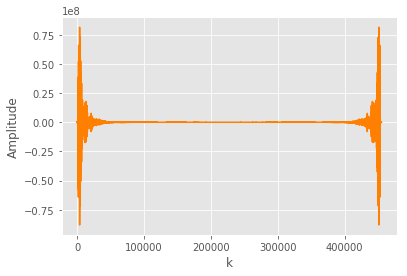

In [42]:
from numpy import fft as fft

fourier=fft.fft(channel1)

plt.plot(fourier, color='#ff7f00')
plt.xlabel('k')
plt.ylabel('Amplitude')

Plotting the Frequency against the sound using the FFT method

C:\Users\Madhuja Gosavi\Anaconda3\lib\site-packages\numpy\core\numeric.py:492: ComplexWarning:

Casting complex values to real discards the imaginary part



44099.9031007752


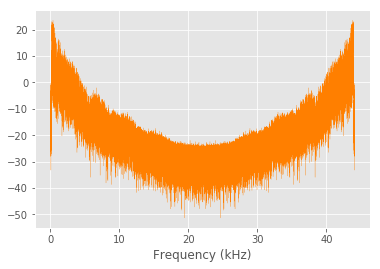

In [43]:
n = len(channel1)
fourier = fourier[0:n]

# scale by the number of points so that the magnitude does not depend on the length
fourier = fourier / float(n)

#calculate the frequency at each point in Hz
freqArray = np.arange(0, n, 1.0) * (rate*1.0/n);

plt.plot(freqArray/1000, 10*np.log10(fourier), color='#ff7f00', linewidth=0.2)
plt.xlabel('Frequency (kHz)')
print(freqArray.max())

There is one more way in which we can combine the frequency, amplitude and the sound measure in a single graph.
This graph is known as the Spectrogram which shows us the spectrum of the selected Audio file.

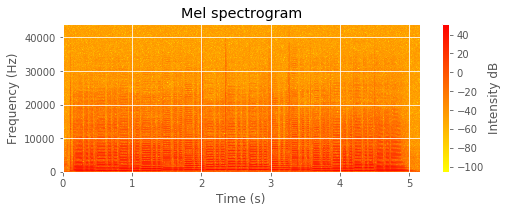

In [44]:
plt.figure(2, figsize=(8,6))
plt.subplot(211)
Pxx, freqs, bins, im = plt.specgram(channel1, Fs=rate*2, NFFT=1024, cmap=plt.get_cmap('autumn_r'))
cbar=plt.colorbar(im)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
cbar.set_label('Intensity dB')
plt.title('Mel spectrogram')
plt.show()

Now, lets perform the removing outliers part on the selected audio file.

In [45]:
from tqdm import tqdm_notebook as tqdm
import IPython.display as ipd
from scipy.io import wavfile

ipd.Audio(path+'12a650a4.wav')



Plot the audio chart with MatPlot

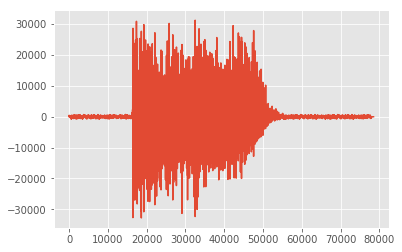

In [46]:
sample_rate, audio = wavfile.read(path+'12a650a4.wav')

plt.plot(audio); 

To remove the outlier we will define the two functions normalize_audio and divide_audio which will return audio and start and end of the audio file

In [47]:
def normalize_audio(audio):
    # audio = (audio + 32768) / 65535 (only if bits were correct)
    audio = audio / max(np.abs(audio))
    return audio

In [48]:
def divide_audio(audio, resolution=100, window_duration=0.1, minimum_power=0.001, sample_rate=44100):    
    duration = len(audio) / sample_rate # in samples/sec
    iterations = int(duration * resolution)
    step = int(sample_rate / resolution)
    window_length = np.floor(sample_rate * window_duration)
    audio_power = np.square(normalize_audio(audio)) / window_length #Normalized power to window duration

    start = np.array([])
    stop = np.array([])
    is_started = False
    
    for n in range(iterations):
        power = 10 * np.sum(audio_power[n * step : int(n * step + window_length)]) # sensitive
        if not is_started and power > minimum_power:
            start = np.append(start, n * step + window_length / 2)
            is_started = True
        elif is_started and (power <= minimum_power or n == iterations-1):
            stop = np.append(stop, n * step + window_length / 2)
            is_started = False
    
    if start.size == 0:
        start = np.append(start, 0)
        stop = np.append(stop, len(audio))
        
    start = start.astype(int)
    stop = stop.astype(int)
    
    # We don't want to eliminate EVERYTHING that's unnecessary
    # There should be a little boundary...
    # 200 frame buffer before and after
    
    # minus = ?
    if start[0] > 200:
        minus = 200
    else:
        minus = start[0]
        
    # plus = ?
    if (len(audio) - stop[0]) > 200:
        plus = 200
    else:
        plus = len(audio) - stop[0]
    
    return (start - minus), (stop + plus)


Plotting the audio file after removing the outliers

[14353]
[55766]


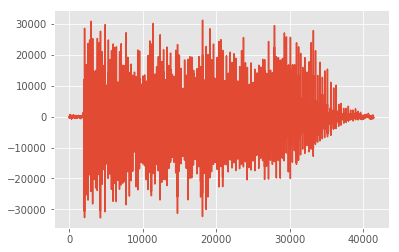

In [49]:
# same wav file as before
start, stop =  divide_audio(audio)
print(start)
print(stop)
plt.plot(audio[start[0]:stop[0]]);

REFERENCES:

https://www.kaggle.com/ashishpatel26/best-trick-for-audio-data/notebook

https://towardsdatascience.com/urban-sound-classification-part-1-99137c6335f9

https://www.kaggle.com/morrisb/freesound-classification/notebook

https://plot.ly/python/bar-charts/#grouped-bar-chart